In [40]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings

df = pd.read_csv('training.csv')

warnings.filterwarnings("ignore")
warnings.filterwarnings("ignore", category=FutureWarning)
from matplotlib import rcParams
rcParams["figure.figsize"] = 12, 6
sns.set_style('darkgrid')

# Data Information
In this section, we will look at the general info of the uncleaned data

In [41]:
df.head()

,Unnamed: 0,surface_x,surface_y,bh_x,bh_y,standardized_operator_name,gross_perforated_length,number_of_stages,total_proppant,total_fluid,...,relative_well_position,batch_frac_classification,well_family_relationship,frac_type,frac_seasoning,horizontal_midpoint_x,horizontal_midpoint_y,horizontal_toe_x,horizontal_toe_y,OilPeakRate
0,0,1383493.751,717329.2368,1382854.564,712767.3700,1121,3963.582677,NaN,76000.0000,NaN,...,Standalone Well,Unknown,Standalone Well,Primary Frac,NaN,1383030.678,714796.3610,1382668.912,712798.4321,46.623023
1,1,1380344.035,711916.2732,1379738.429,707860.5643,1022,3179.133858,NaN,113000.0000,5.610964e+05,...,Outer Well,Unknown,Infill Child Well,Primary Frac,NaN,1379965.126,709541.7145,1379630.025,707907.6708,59.750009
2,2,1379915.895,717845.0063,1379274.644,713471.9952,1304,3810.039370,12.0,286571.4286,1.621424e+06,...,Standalone Well,Non-Batch Frac,Standalone Well,Primary Frac,92.0,1379357.250,715381.2327,1378960.372,713530.4490,10.785716
3,3,1383567.443,706640.2010,1382891.477,702068.3838,1022,3723.425197,11.0,106878.9286,4.377134e+05,...,Standalone Well,Unknown,Standalone Well,Primary Frac,NaN,1383099.610,704058.8508,1382727.299,702098.4882,123.797638
4,4,1378962.585,702623.9787,1379643.546,707204.9131,1022,3811.023622,NaN,112789.7143,6.229802e+05,...,Outer Well,Unknown,Infill Child Well,Primary Frac,NaN,1379546.414,705150.7519,1379987.487,707123.7258,102.309540


there are originally 29692 rows (inputs) in the data and 31 features

In [42]:
df.shape

(29692, 31)

dropping average_frac_fluid_per_stage, average_proppant_per_stage, average_stage_length, number_of_stages as they have around 95% null values and it is not worth it to try and imputate.

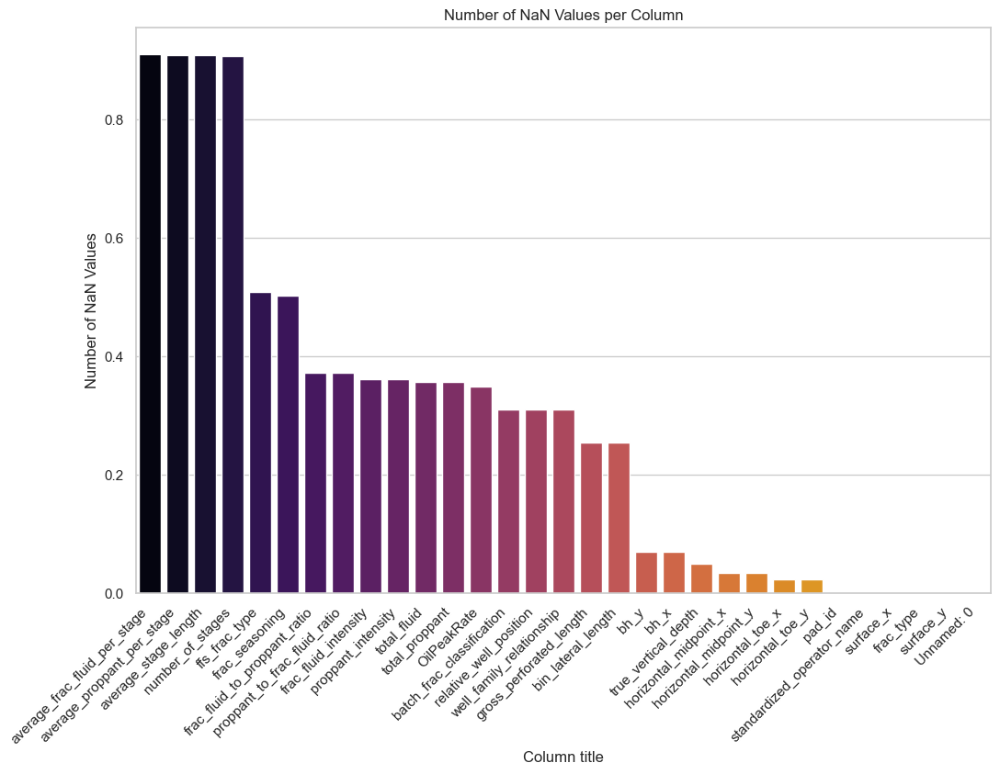

In [43]:
# Plotting the Null/NaN values in the dataset
sorted_nans_per_column = (df.isna().sum()/len(df)).sort_values(ascending=False)

sns.set(style="whitegrid")
plt.figure(figsize=(12, 8))

# Barplot of NaN values per column
nanplt = sns.barplot(x=sorted_nans_per_column.index, y=sorted_nans_per_column.values, palette="inferno")

nanplt.set(xlabel='Column title', ylabel='Number of NaN Values', title='Number of NaN Values per Column')

plt.xticks(rotation=45, ha='right')
plt.show()

In [44]:
df.drop(['average_frac_fluid_per_stage', 'average_proppant_per_stage', 'average_stage_length',
          'number_of_stages'], axis=1, inplace=True) # Dropping columns with too many NaN values

df.drop(['Unnamed: 0', 'pad_id', 'frac_type', 'batch_frac_classification', 
        'standardized_operator_name'], axis=1, inplace=True) # Dropping columns that are not useful

In [45]:
df.isnull().sum()

surface_x                           0
surface_y                           0
bh_x                             2087
bh_y                             2087
gross_perforated_length          7557
total_proppant                  10612
total_fluid                     10616
true_vertical_depth              1495
ffs_frac_type                   15107
proppant_intensity              10721
frac_fluid_intensity            10746
proppant_to_frac_fluid_ratio    11036
frac_fluid_to_proppant_ratio    11036
bin_lateral_length               7557
relative_well_position           9225
well_family_relationship         9225
frac_seasoning                  14924
horizontal_midpoint_x            1001
horizontal_midpoint_y            1001
horizontal_toe_x                  711
horizontal_toe_y                  711
OilPeakRate                     10386
dtype: int64

# Data Cleaning and Visualization

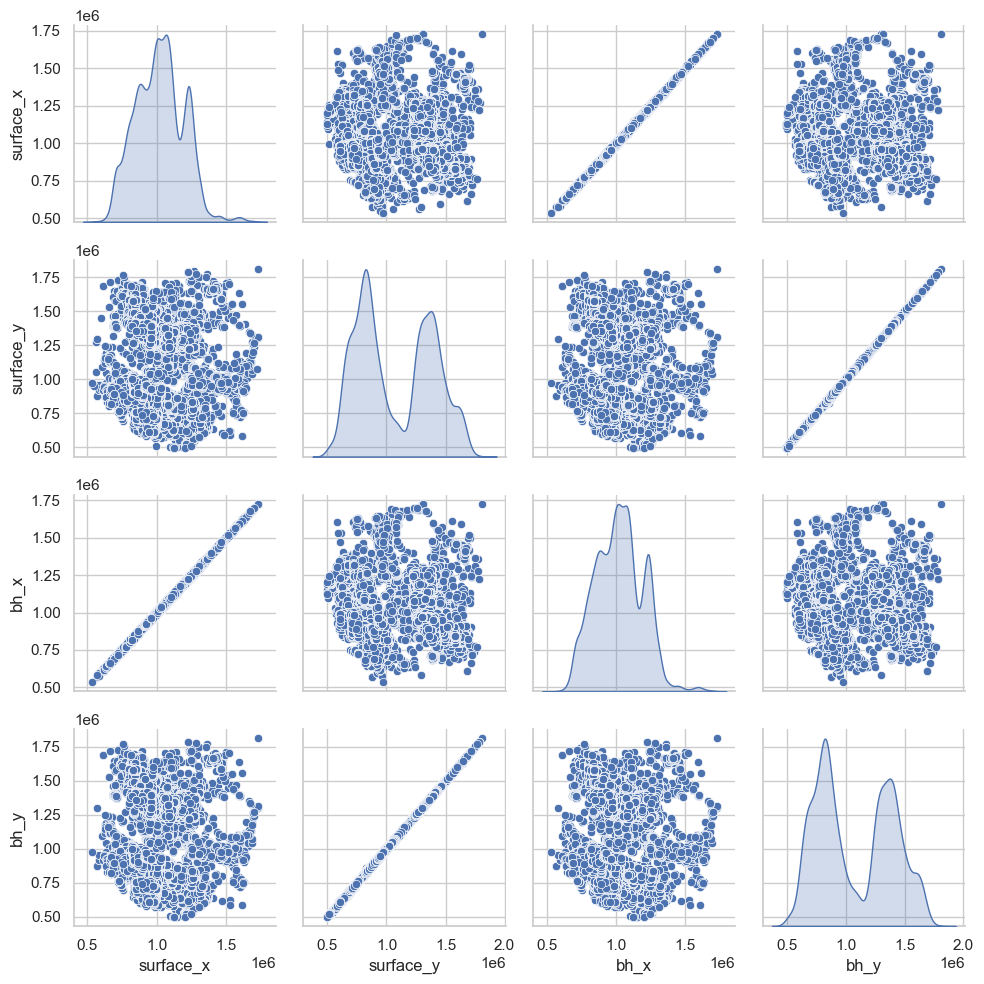

In [46]:
subset_cols_1 = ['surface_x', 'surface_y', 'bh_x', 'bh_y']

subset_df = df[subset_cols_1]

custom_palette = sns.color_palette("rocket", as_cmap=True)

# Pair plot of the subset of columns
sns.pairplot(subset_df, palette=custom_palette, markers='o', diag_kind='kde')
plt.tight_layout()
plt.show()

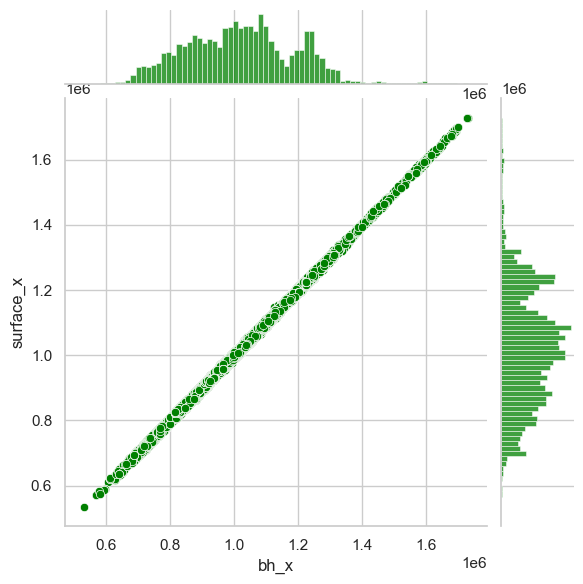

In [47]:
sns.jointplot(x = "bh_x", y = "surface_x", data = subset_df, kind = "scatter", color = "green")
plt.show()

This model shows that there is a strong linear relationship between the bh_x and surface_x. We will now try to use Linear Regression to predict the missing values

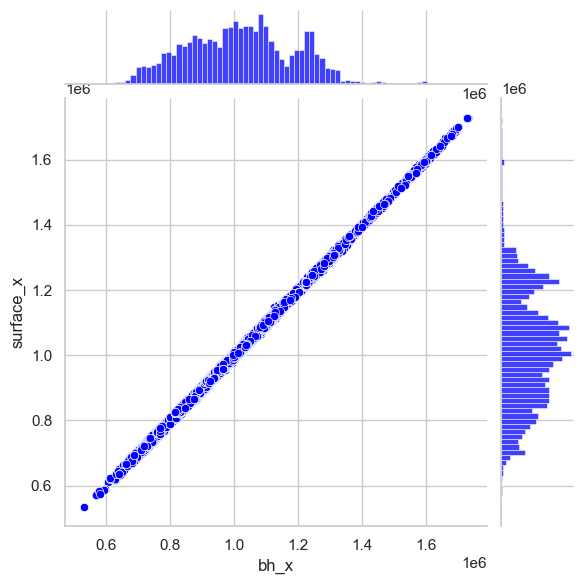

In [48]:
from sklearn.linear_model import LinearRegression

subset_train_df = df[['surface_x', 'bh_x']].dropna()

X = subset_train_df[['surface_x']]
y = subset_train_df['bh_x']

lr_model = LinearRegression()
lr_model.fit(X, y)

missing_bh_x_rows = df['bh_x'].isna()

df.loc[missing_bh_x_rows, 'bh_x'] = lr_model.predict(df.loc[missing_bh_x_rows, ['surface_x']])

sns.jointplot(x = "bh_x", y = "surface_x", data = subset_train_df, kind = "scatter", color = "blue")

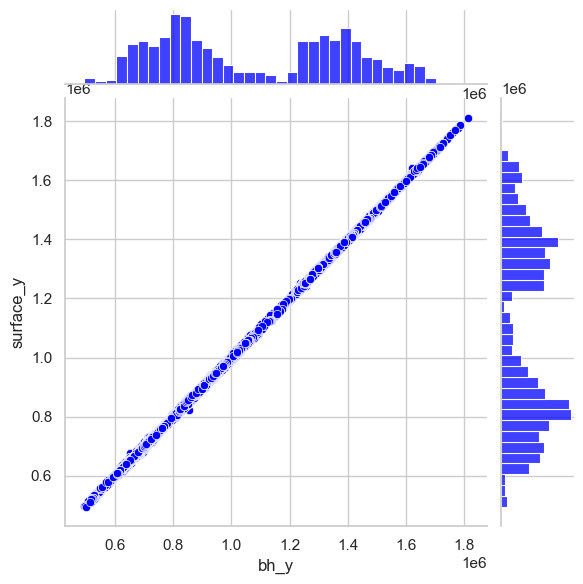

In [49]:
# Repeat for bh_y
subset_train_df = df[['surface_y', 'bh_y']].dropna()

X = subset_train_df[['surface_y']]
y = subset_train_df['bh_y']

lr_model_y = LinearRegression()
lr_model_y.fit(X, y)

missing_bh_x_rows = df['bh_y'].isna()

df.loc[missing_bh_x_rows, 'bh_y'] = lr_model_y.predict(df.loc[missing_bh_x_rows, ['surface_y']])

sns.jointplot(x = "bh_y", y = "surface_y", data = subset_train_df, kind = "scatter", color = "blue")

Now we can deal with the outliers by replacing them with the mean.

In [50]:
df.dropna(subset=['OilPeakRate'], inplace=True)
df.replace([np.inf, -np.inf], np.nan, inplace=True)
def find_mean_std(df, col):
    mean = df[col].mean()
    std = df[col].std()
    return mean, std

for col in df.columns:  
    if(df[col].dtype == 'object'):
        continue
    mean, std = find_mean_std(df, col)
    df[col] = df[col].apply(lambda x: mean if x > mean + 3 * std else x)
    df[col] = df[col].apply(lambda x: mean if x < mean - 3 * std else x)

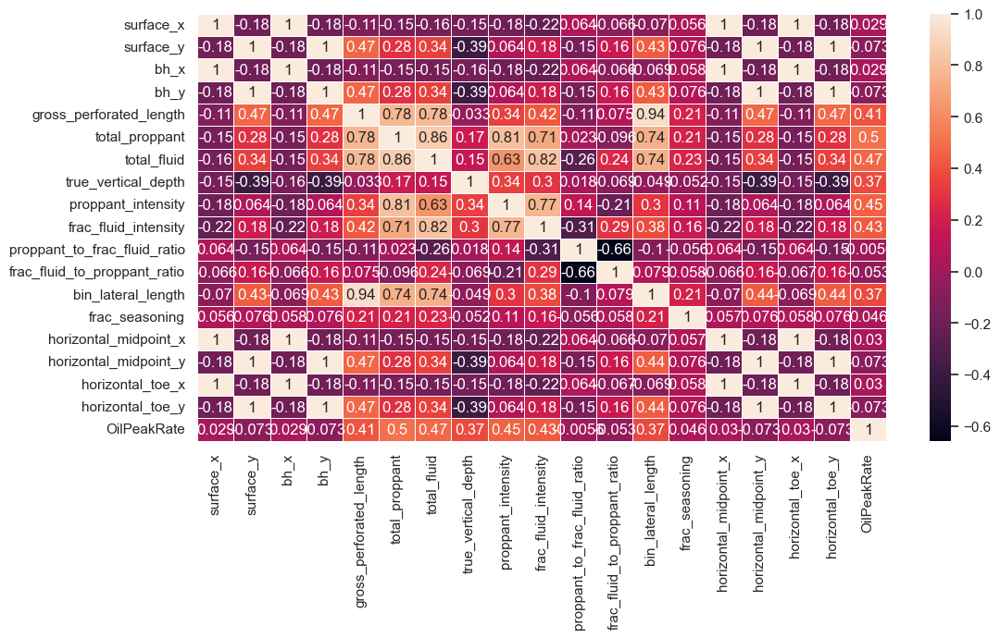

In [51]:
numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']

newdf = df.select_dtypes(include=numerics)
sns.heatmap(newdf.corr(), annot=True, linewidths=.5) # Plotting the correlation matrix
plt.show()

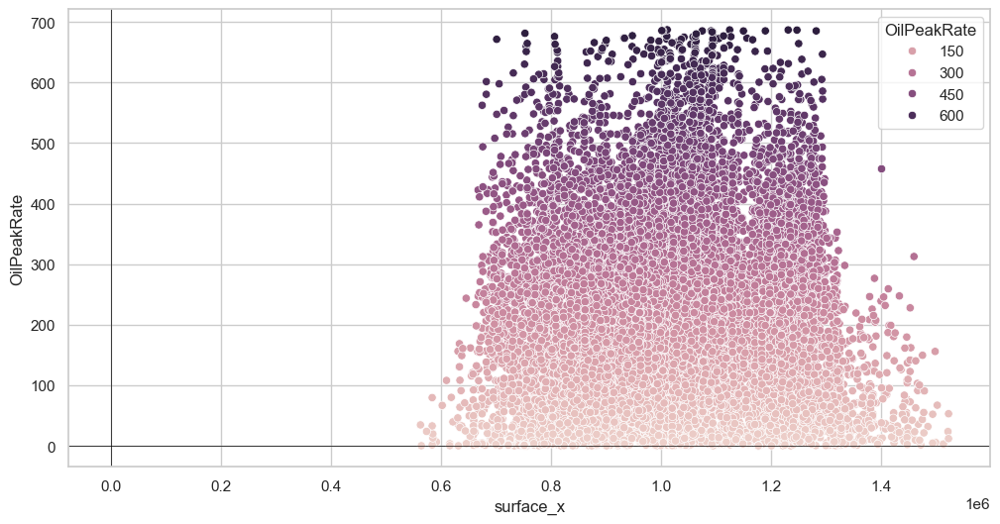

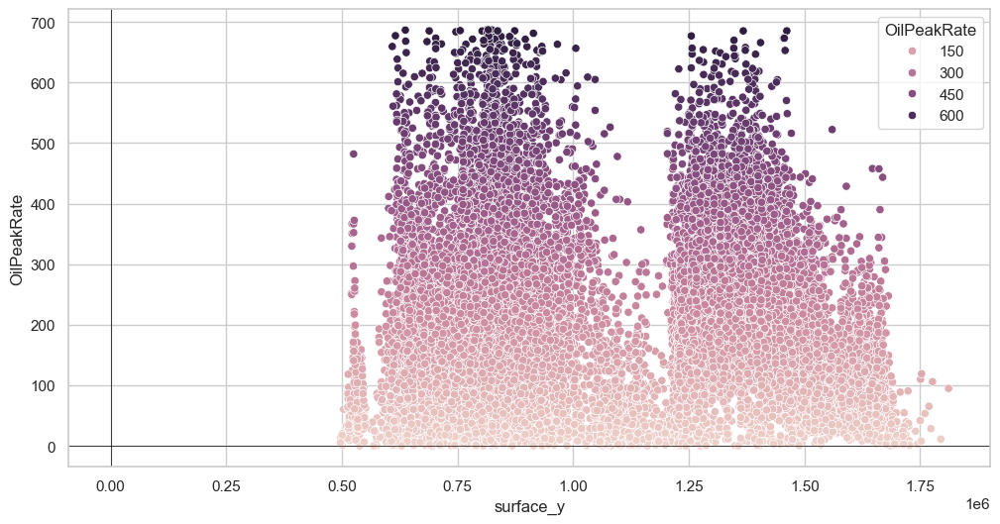

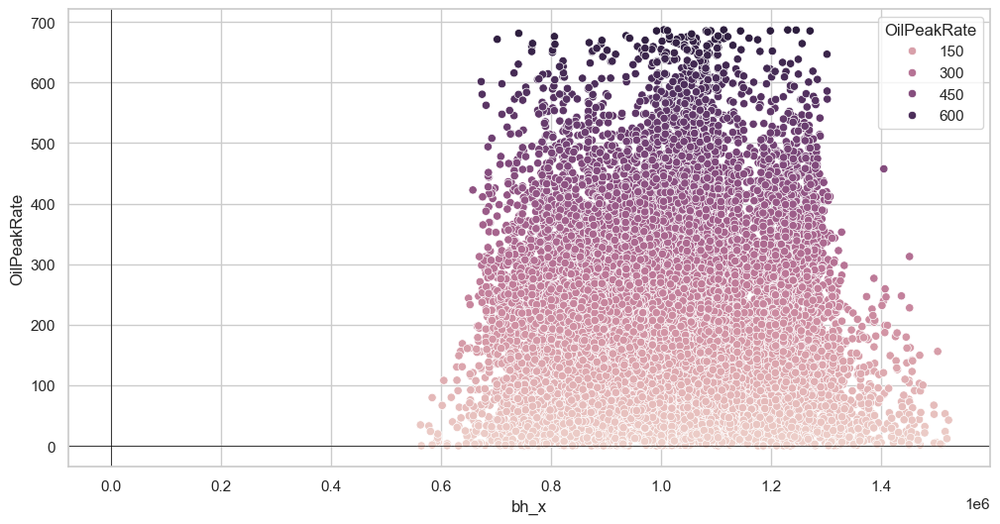

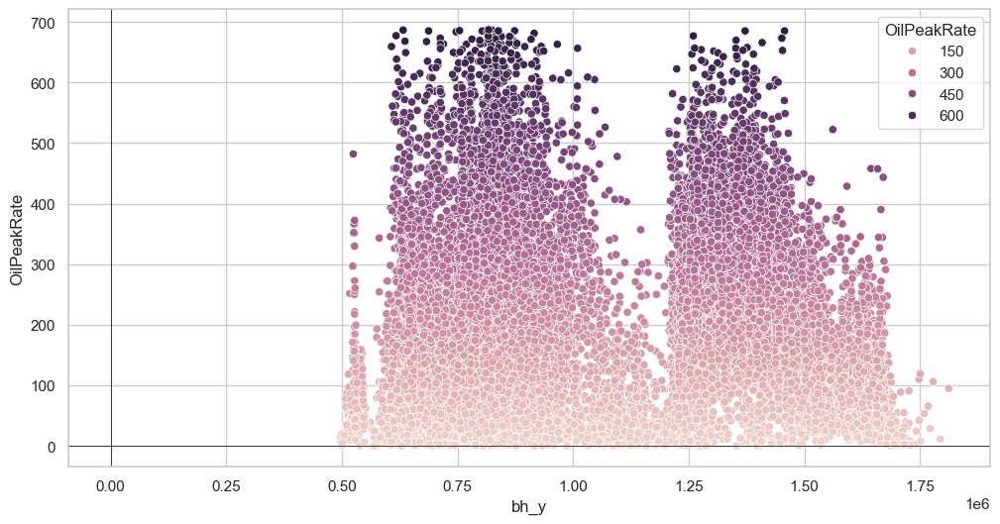

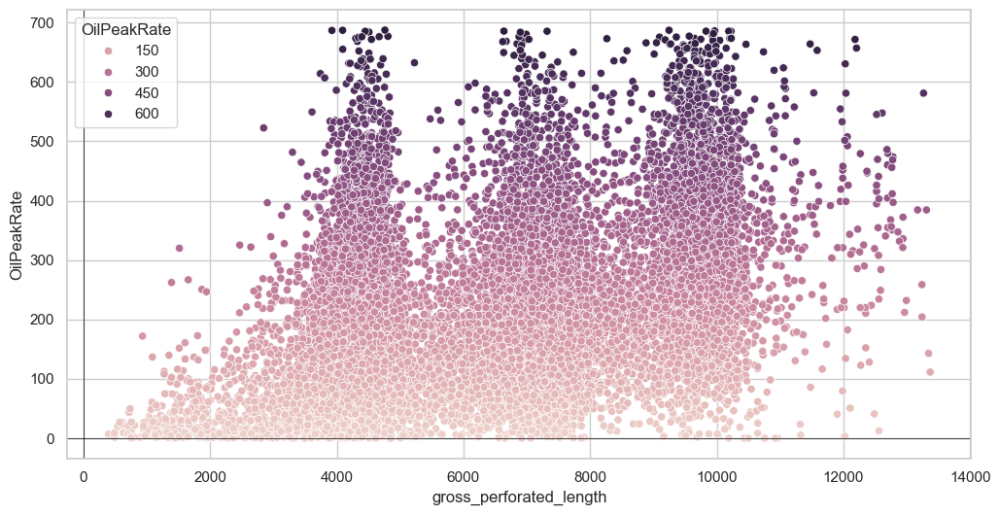

...

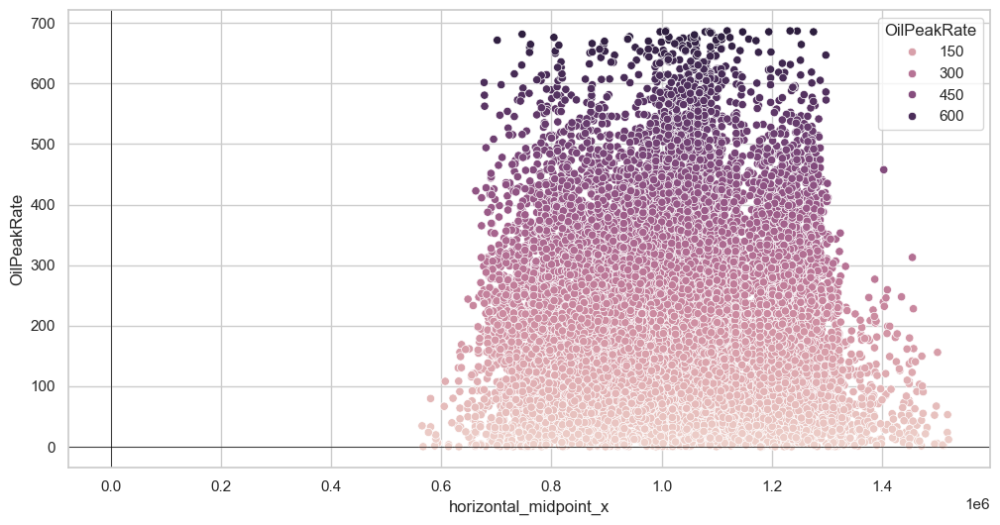

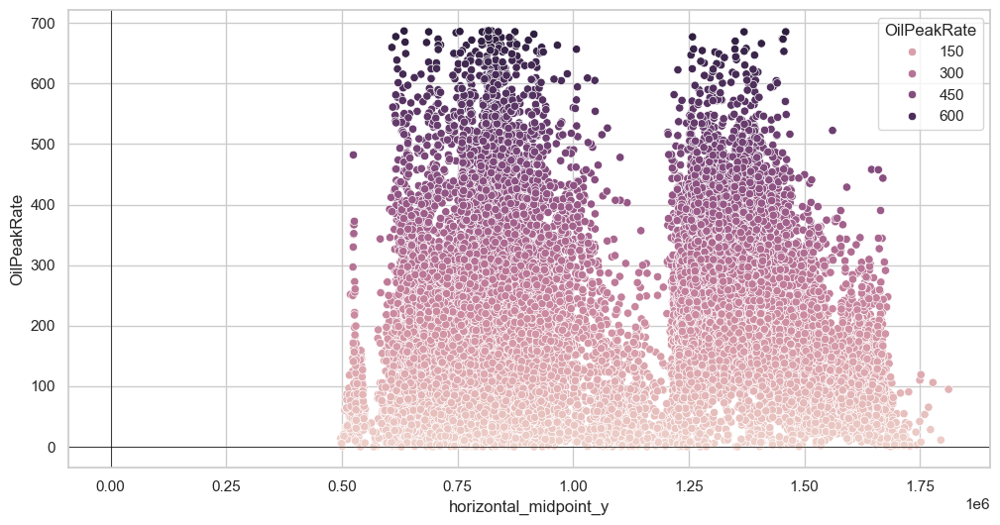

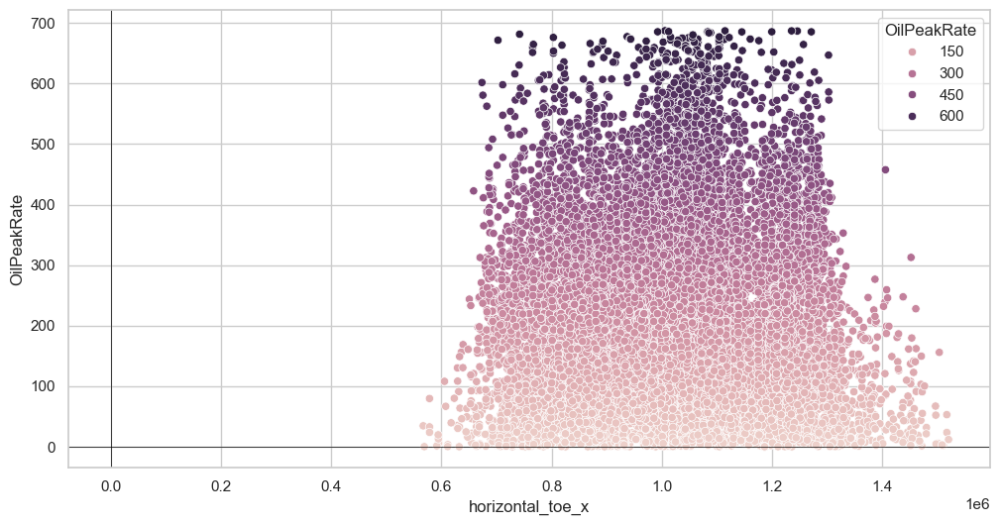

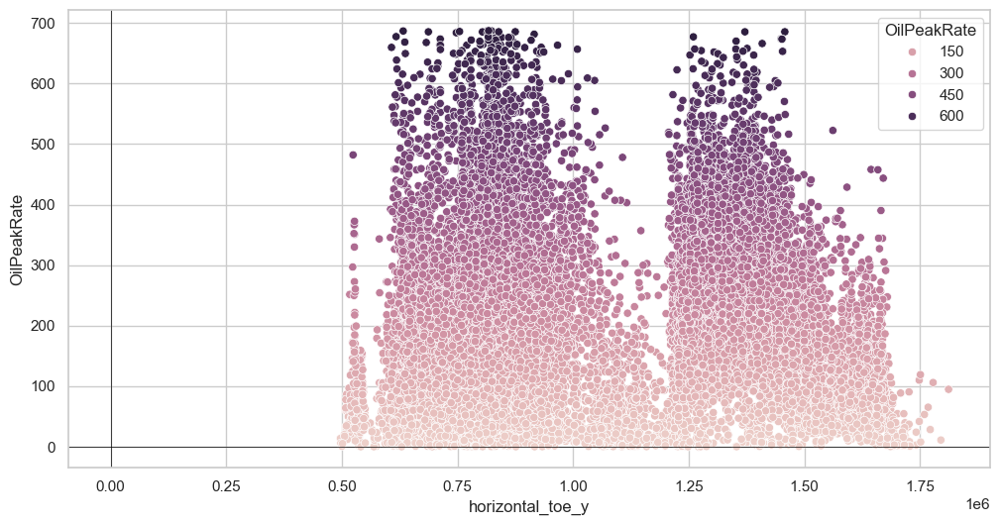

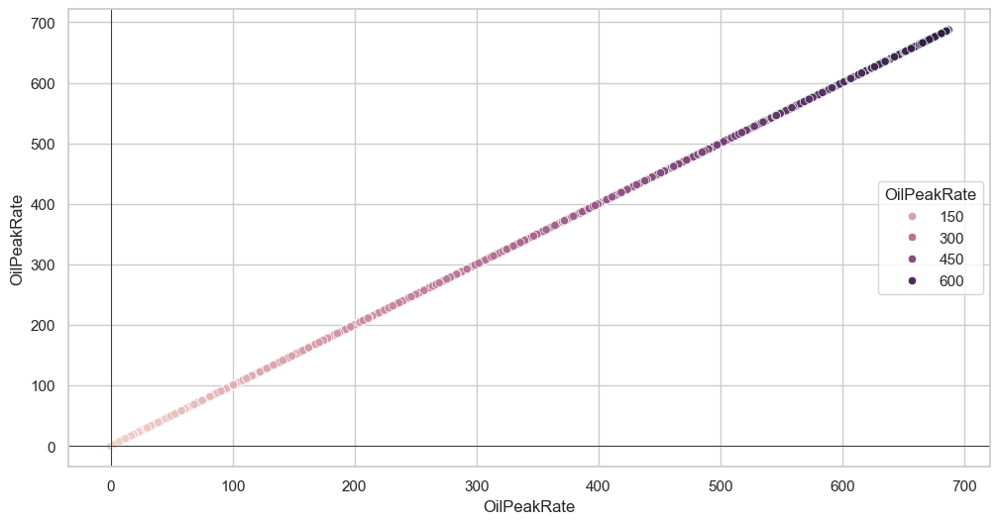

In [52]:
sns.color_palette("hls", 8)
for col in df.columns:
    sns.scatterplot(x=df[col],y=df['OilPeakRate'], marker='o', hue=df['OilPeakRate'])
    plt.axhline(0, color='black',linewidth=0.5)
    plt.axvline(0, color='black',linewidth=0.5)
    
    plt.show()
    

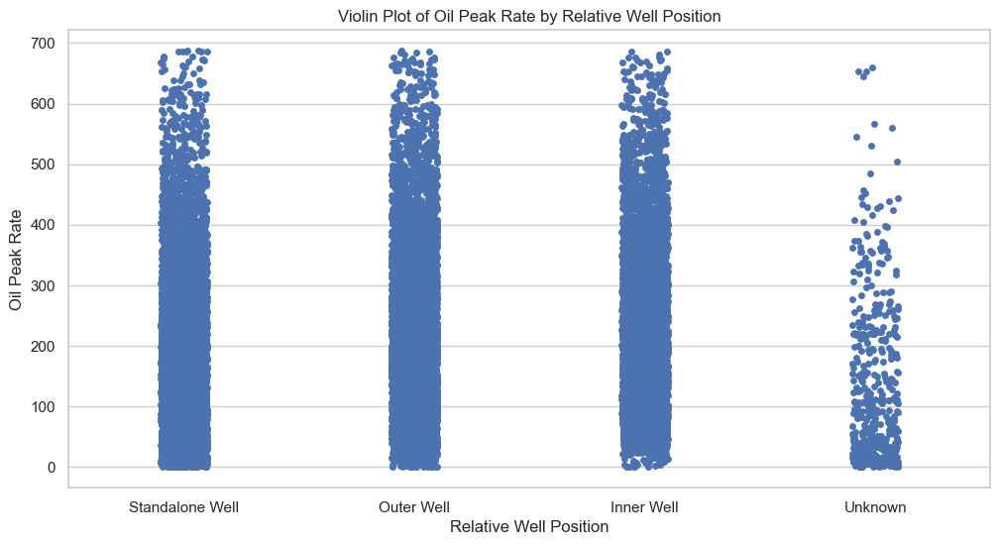

In [53]:
sns.stripplot(x="relative_well_position", y=df['OilPeakRate'], data=df)
plt.title("Violin Plot of Oil Peak Rate by Relative Well Position")
plt.xlabel("Relative Well Position")
plt.ylabel("Oil Peak Rate")
plt.show()

# kNN Imputation
Now we can imputate the data that has less than 30% null/nan values

In [54]:
def impute_columns(df, threshold=0.5):
    cols = []
    for col in df.columns:
        if (df[col].isnull().sum() / len(df) < threshold) and (df[col].dtype != 'object'):
            cols.append(col)
    return cols

from sklearn.impute import KNNImputer

knn_imputer = KNNImputer(n_neighbors=10)  

full_impute_df = df.copy()
cols_to_imputate = impute_columns(df, threshold=0.3)

full_impute_df[cols_to_imputate] = knn_imputer.fit_transform(df[cols_to_imputate])
full_impute_df.isnull().sum()

surface_x                          0
surface_y                          0
bh_x                               0
bh_y                               0
gross_perforated_length            0
total_proppant                     0
total_fluid                        0
true_vertical_depth                0
ffs_frac_type                   4996
proppant_intensity                 0
frac_fluid_intensity               0
proppant_to_frac_fluid_ratio       0
frac_fluid_to_proppant_ratio       0
bin_lateral_length                 0
relative_well_position             0
well_family_relationship           0
frac_seasoning                     0
horizontal_midpoint_x              0
horizontal_midpoint_y              0
horizontal_toe_x                   0
horizontal_toe_y                   0
OilPeakRate                        0
dtype: int64

Through imputation, we got a dataset in which only one feature has null values. This feature has almost 5000 null values and might not be worth to imputate as there is less than 70% non-null values. In this project, we will take out the null values, but we could also replace them with the most frequent value (this might cause the model to get confused as it will not be accurate data). Our goal is to <u>minimize data contamination while maximizing the training set size </u>

In [55]:
full_impute_df.dropna(inplace=True)
full_impute_df.isnull().sum()

surface_x                       0
surface_y                       0
bh_x                            0
bh_y                            0
gross_perforated_length         0
total_proppant                  0
total_fluid                     0
true_vertical_depth             0
ffs_frac_type                   0
proppant_intensity              0
frac_fluid_intensity            0
proppant_to_frac_fluid_ratio    0
frac_fluid_to_proppant_ratio    0
bin_lateral_length              0
relative_well_position          0
well_family_relationship        0
frac_seasoning                  0
horizontal_midpoint_x           0
horizontal_midpoint_y           0
horizontal_toe_x                0
horizontal_toe_y                0
OilPeakRate                     0
dtype: int64

In [56]:
full_impute_df.shape

(14310, 22)

We have 14310 usable entries for the model. Now lets export this csv file

In [57]:
full_impute_df.to_csv('cleaned_data.csv', index=False)